In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive
drive.mount ('/content/drive')

from IPython.display import Image


Mounted at /content/drive


In [3]:
img = cv2.imread('/content/drive/MyDrive/IMP301/PT2/data/cameraman_noise.png', 0)

img1 = cv2.imread('/content/drive/MyDrive/IMP301/PT2/data/printsalesgallery-thephotographers-gallery-wolfgang-suschitzky-guy-the-gorilla-london-zoo-1958.jpg', 0)

img2 = cv2.imread('/content/drive/MyDrive/IMP301/PT2/data/1Untitled.png', 0)

# plt.imshow(img, cmap='gray')
# plt.show()
# plt.imshow(img1, cmap='gray')
# plt.show()
# plt.imshow(img2, cmap='gray')
# plt.show()


#1. ideal band reject/pass filter



1.1. ideal band reject filter


In [4]:
# Get the fourier transform of the image
F = np.fft.fft2(img)
F1 = np.fft.fft2(img1)
F2 = np.fft.fft2(img2)

#Shift zero to center
F = np.fft.fftshift(F)
F1 = np.fft.fftshift(F1)
F2 = np.fft.fftshift(F2)
# ideal bandstop filter
def IBF(F, C0, W):
    M,N = F.shape
    H = np.zeros((M, N), dtype=np.complex128)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= C0 - W/2 or D >= C0 + W/2:
                H[u,v] = 1
            else:
                H[u,v] = 0
    return H

In [5]:



# plotting the graph
def plot_result(img,I_IBF,S_IBF,content):
   plt.figure(figsize = (24,12))
   plt.subplot(131)  
   plt.imshow(img, cmap='gray')
   plt.title('Input Image')
   plt.axis('off')
   plt.subplot(132)  
   plt.imshow(I_IBF, cmap='gray')
   plt.title(content+'\'s  Output Image')
   plt.axis('off')
   plt.subplot(133)
   plt.imshow(S_IBF, cmap='gray')
   plt.title(content+'\'s  Output Image')
   plt.axis('off')
  #  plt.show()

  
  

<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


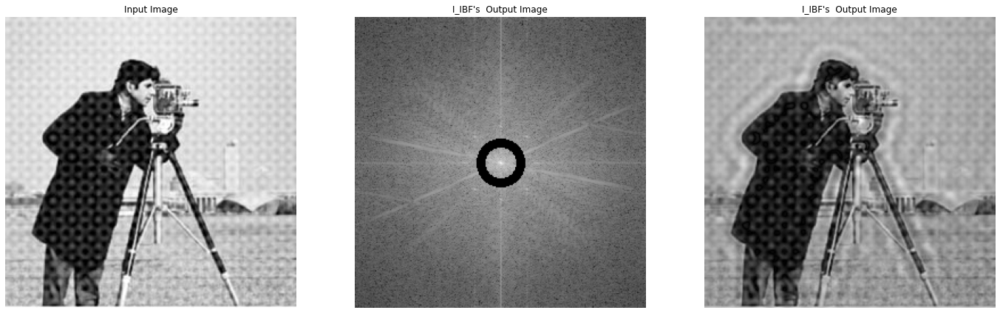

In [6]:
def Transforming(H,F):
  G=H*F
  S=20*np.log(np.abs(G))
  I = np.fft.ifftshift(G)
  iverseG =np.fft.ifft2(I)
  S = np.uint32(np.abs(S))
  I = np.uint32(np.abs(iverseG))
  return [S,I]


# Defining the parameters
C0 = 35/2
W = 8 #8
n = 1 # For butterworth filter only

H_IBF = IBF(F, C0, W)
I_IBF = Transforming(H_IBF,F)
plot_result(img,I_IBF[0],I_IBF[1],'I_IBF')


<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


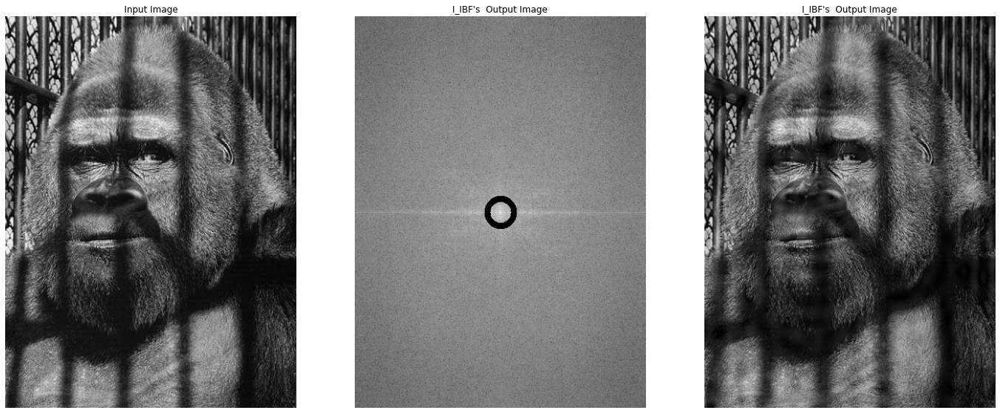

In [7]:

H_IBF1 = IBF(F1, C0, W)
I_IBF1 = Transforming(H_IBF1,F1)
plot_result(img1,I_IBF1[0],I_IBF1[1],'I_IBF')

<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


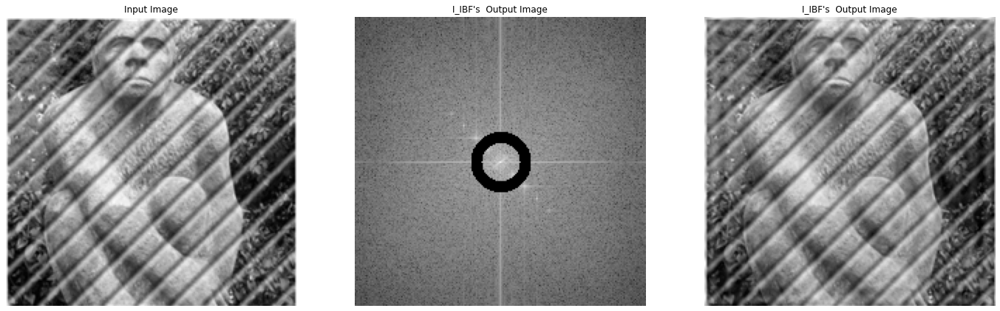

In [8]:

H_IBF2 = IBF(F2, C0, W)
I_IBF2 = Transforming(H_IBF2,F2)
plot_result(img2,I_IBF2[0],I_IBF2[1],'I_IBF')

1.2: ideal high pass filter

In [9]:
# Ideal High Pass Filter
def IHPF(F, D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            if D > D0:
                H[u, v] = 1
            else:
                H[u, v] = 0
    G = F * H
    return G

In [10]:
# Define the Cut-off frequency
D0 = 80 #30
# Apply the filters
G_IHPF = IHPF(F, D0)
# Get the inverse fourier transform of the filters
G_IHPF = np.fft.ifft2(np.fft.ifftshift(G_IHPF))
# Get the abs value and typecast to uint8
img_IHPF = np.abs(G_IHPF).astype(np.uint8)

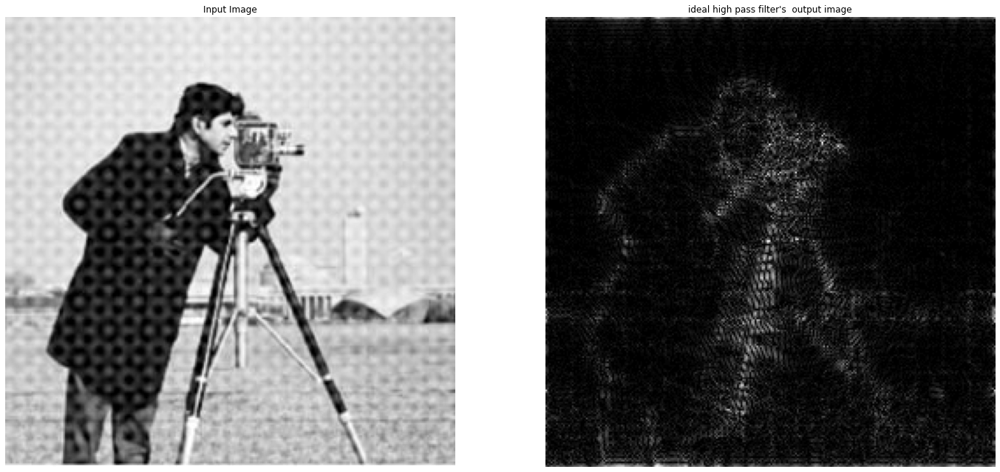

In [11]:
# plotting the graph
def plot_2img(img,I_IBF,content):
   plt.figure(figsize = (24,12))
   plt.subplot(121)  
   plt.imshow(img, cmap='gray')
   plt.title('Input Image')
   plt.axis('off')
   plt.subplot(122)  
   plt.imshow(I_IBF, cmap='gray')
   plt.title(content+'\'s  output image')
   plt.axis('off')
   
plot_2img(img,img_IHPF,"ideal high pass filter")   

1.3: ideal low pass filter

In [12]:
# Ideal Low Pass Filter
def ILPF(F, D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            if D <= D0:
                H[u, v] = 1
            else:
                H[u, v] = 0
    G = F * H
    return G

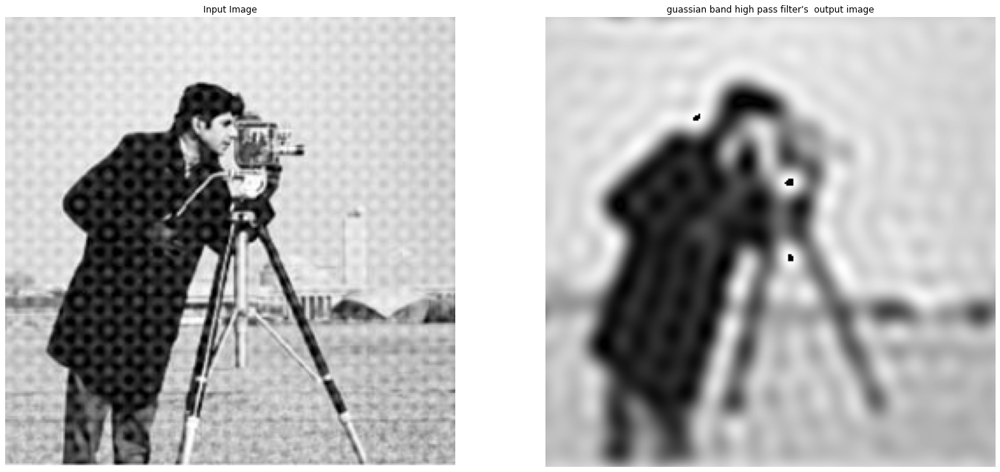

In [13]:
# Define the Cut-off frequency
D0 = 15
# Apply the filters
G_ILPF = ILPF(F, D0)
# Get the inverse fourier transform of the filters
G_ILPF = np.fft.ifft2(np.fft.ifftshift(G_ILPF))
# Get the abs value and typecast to uint8
img_ILPF = np.abs(G_ILPF).astype(np.uint8)

plot_2img(img,img_ILPF,"guassian band high pass filter")  

#2. butterworth band reject/pass filter

2.1: butterworth band reject filter

In [14]:
# butterworth bandstop filter
def BBF(F, C0, W, n):
    M,N = F.shape
    H = np.zeros((M, N), dtype=np.complex128)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            H[u,v] = 1/(1 + ((D*W)/(D**2 - C0**2))**(2*n))
    return H



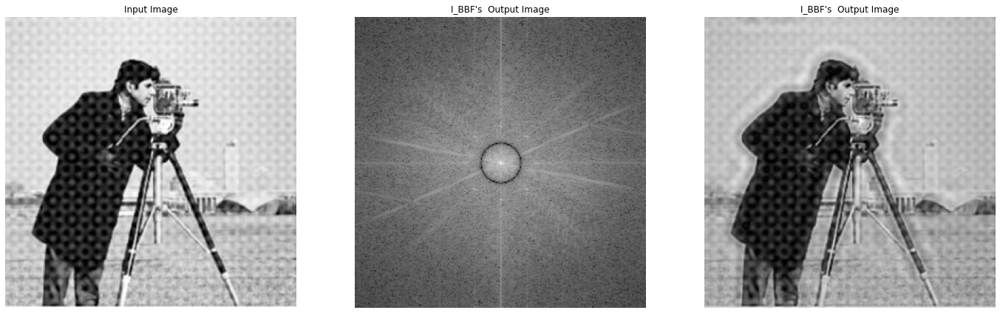

In [15]:
H_BBF = BBF(F, C0, W, n)
I_BBF = Transforming(H_BBF,F)
plot_result(img,I_BBF[0],I_BBF[1],'I_BBF')

<ipython-input-14-7529a26efa08>:8: RuntimeWarning: divide by zero encountered in double_scalars
  H[u,v] = 1/(1 + ((D*W)/(D**2 - C0**2))**(2*n))
<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


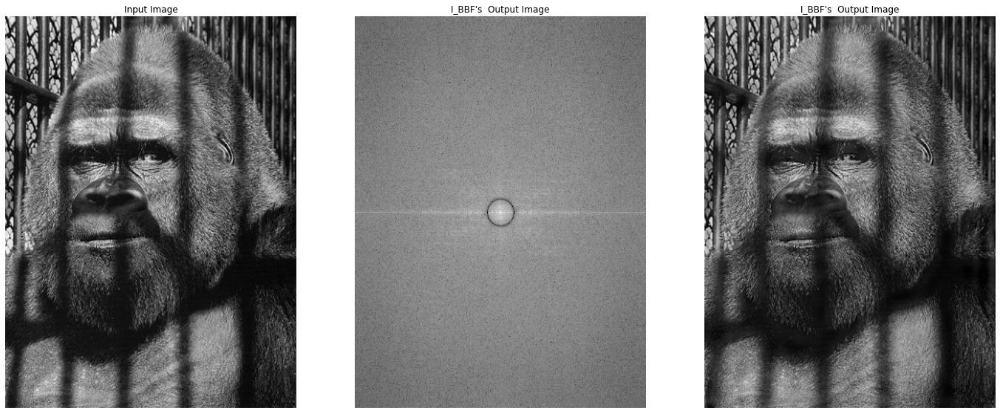

In [16]:
H_BBF1 = BBF(F1, C0, W, n)
I_BBF1 = Transforming(H_BBF1,F1)
plot_result(img1,I_BBF1[0],I_BBF1[1],'I_BBF')

<ipython-input-14-7529a26efa08>:8: RuntimeWarning: divide by zero encountered in double_scalars
  H[u,v] = 1/(1 + ((D*W)/(D**2 - C0**2))**(2*n))
<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


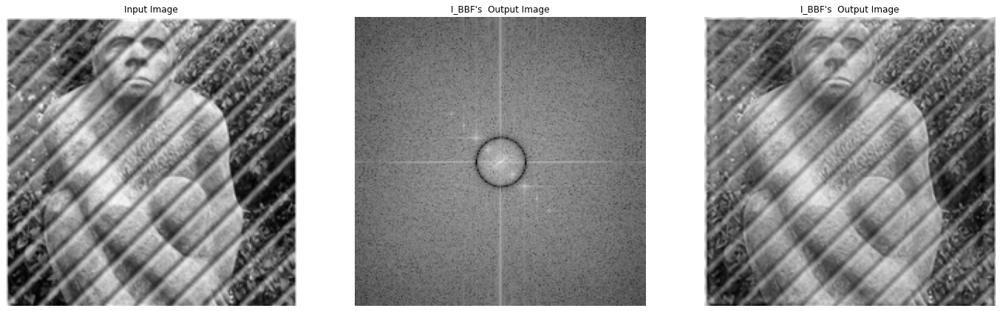

In [17]:
H_BBF2 = BBF(F2, C0, W, n)
I_BBF2 = Transforming(H_BBF2,F2)
plot_result(img2,I_BBF2[0],I_BBF2[1],'I_BBF')

2.2: butterworth band high pass filter

In [18]:
# Butterworth High Pass Filter
def BHPF(F,D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            H[u, v] = 1/(1+(D0/D)**2)
    G = F * H
    return G

In [19]:
# Define the Cut-off frequency
D0 = 80 #30
# Apply the filters
G_BHPF = BHPF(F1, D0)
# Get the inverse fourier transform of the filters
G_BHPF = np.fft.ifft2(np.fft.ifftshift(G_BHPF))
# Get the abs value and typecast to uint8
img_BHPF = np.abs(G_BHPF).astype(np.uint8)

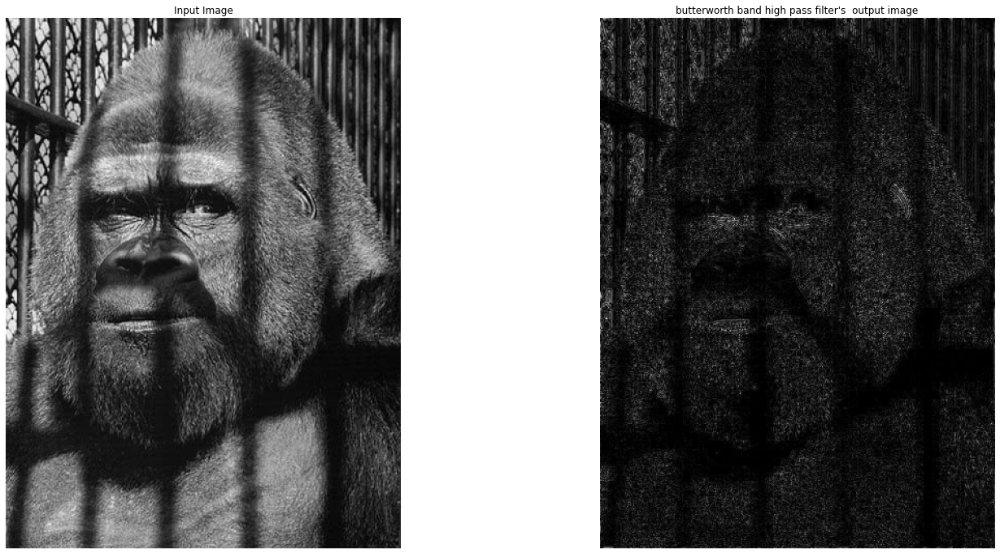

In [20]:
plot_2img(img1,img_BHPF,"butterworth band high pass filter")  

2.3: butterworth band low pass filter

In [21]:
# Butterworth Low Pass Filter
def BLPF(F,D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            H[u, v] = 1/(1+(D/D0)**2)
    G = F * H
    return G

In [22]:
# Define the Cut-off frequency
D0 = 15
# Apply the filters
G_BLPF = BLPF(F1, D0)
# Get the inverse fourier transform of the filters
G_BLPF = np.fft.ifft2(np.fft.ifftshift(G_BLPF))
# Get the abs value and typecast to uint8
img_BLPF = np.abs(G_BLPF).astype(np.uint8)

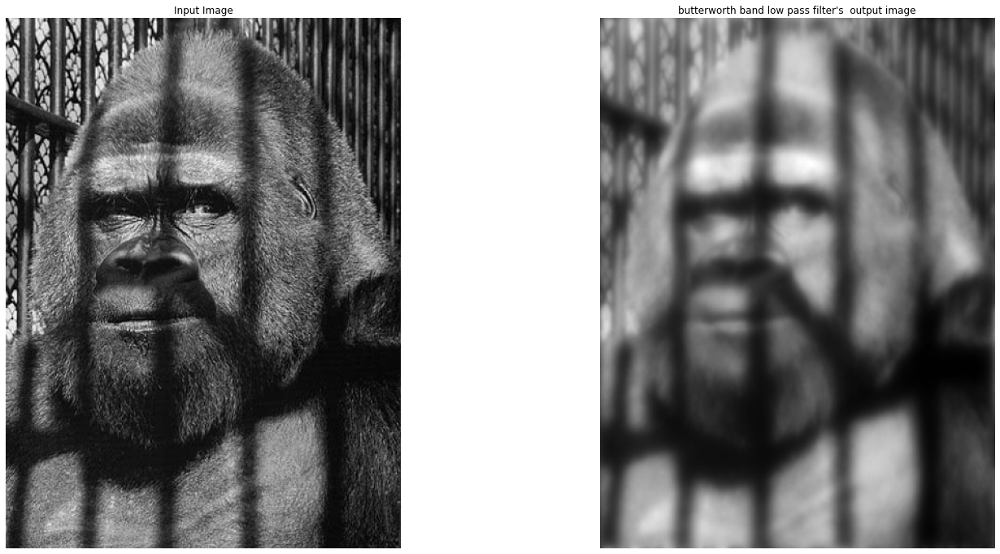

In [23]:
plot_2img(img1,img_BLPF,"butterworth band low pass filter")  

#3.gaussian band reject/pass filter

3.1: gaussian band reject filter

In [24]:
# gaussian bandstop filter
def GBF(F, C0, W):
    M,N = F.shape
    H = np.zeros((M, N), dtype=np.complex128)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            H[u,v] = 1 - np.exp(-1/2*((D**2 - C0**2)/(D*W))**2)
    return H

<ipython-input-24-7198c1c29c9e>:8: RuntimeWarning: divide by zero encountered in double_scalars
  H[u,v] = 1 - np.exp(-1/2*((D**2 - C0**2)/(D*W))**2)


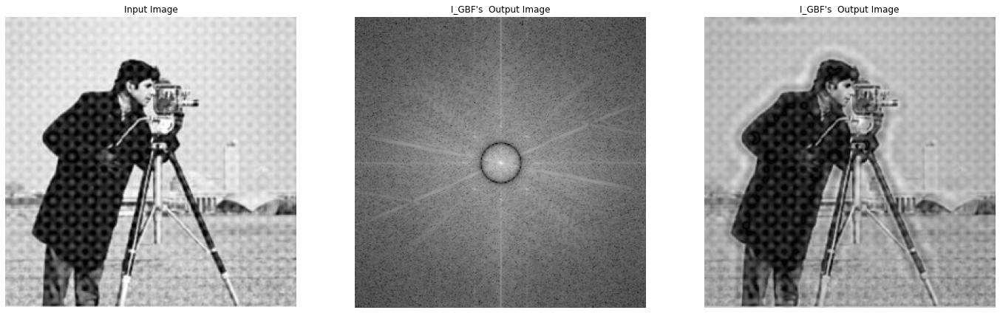

In [25]:
H_GBF = GBF(F, C0, W)
I_GBF = Transforming(H_GBF,F)
plot_result(img,I_GBF[0],I_GBF[1],'I_GBF')

<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


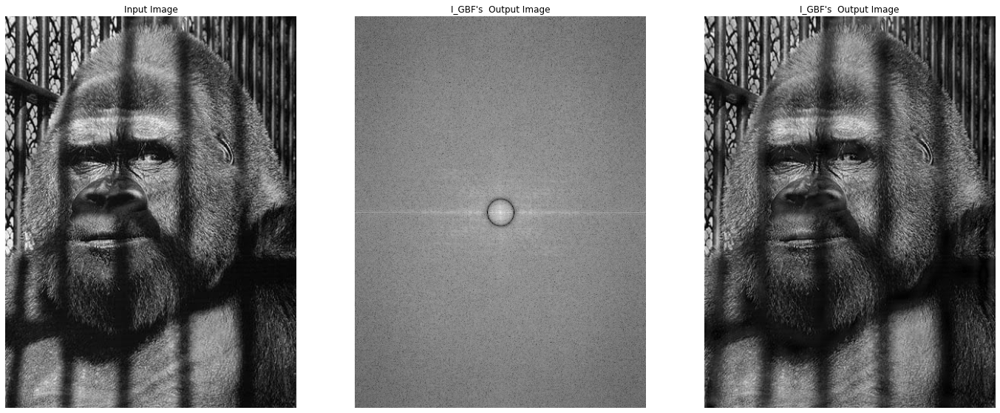

In [26]:
H_GBF1 = GBF(F1, C0, W)
I_GBF1 = Transforming(H_GBF1,F1)
plot_result(img1,I_GBF1[0],I_GBF1[1],'I_GBF')

<ipython-input-6-d84de0c3f016>:3: RuntimeWarning: divide by zero encountered in log
  S=20*np.log(np.abs(G))


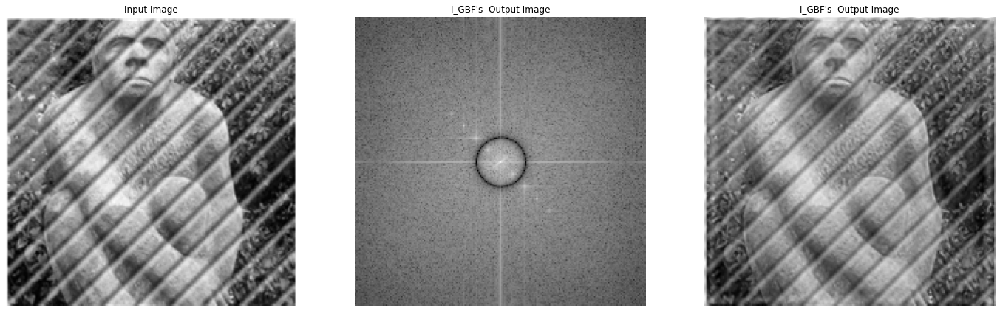

In [27]:
H_GBF2 = GBF(F2, C0, W)
I_GBF2 = Transforming(H_GBF2,F2)
plot_result(img2,I_GBF2[0],I_GBF2[1],'I_GBF')

3.2: gaussian band high pass filter

In [28]:
# Gaussian High Pass Filter
def GHPF(F,D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            H[u, v] = 1 - np.exp(-((D/D0)**2))
    G = F * H
    return G
    

In [29]:
# Define the Cut-off frequency
D0 = 80 #30
# Apply the filters
G_GHPF = GHPF(F2, D0)
# Get the inverse fourier transform of the filters
G_GHPF = np.fft.ifft2(np.fft.ifftshift(G_GHPF))
# Get the abs value and typecast to uint8
img_GHPF = np.abs(G_GHPF).astype(np.uint8)

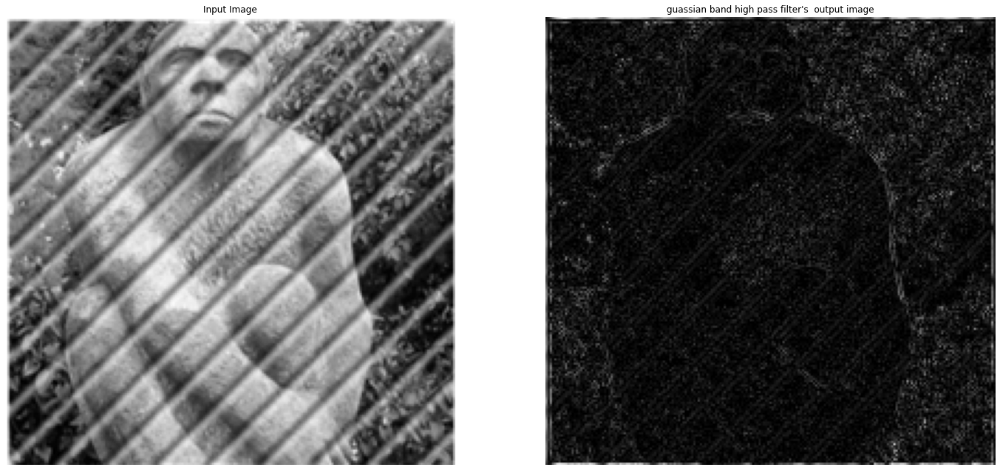

In [30]:
plot_2img(img2,img_GHPF,"guassian band high pass filter")  

3.3: gaussian band low pass filter

In [31]:
# Gaussian Low Pass Filter
def GLPF(F,D0):
    M,N = F.shape
    H = np.zeros((M, N))
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2)
            H[u, v] = np.exp(-((D/D0)**2))
    G = F * H
    return G

In [32]:
# Define the Cut-off frequency
D0 = 15
# Apply the filters
G_GLPF = GLPF(F2, D0)
# Get the inverse fourier transform of the filters
G_GLPF = np.fft.ifft2(np.fft.ifftshift(G_GLPF))
# Get the abs value and typecast to uint8
img_GLPF = np.abs(G_GLPF).astype(np.uint8)


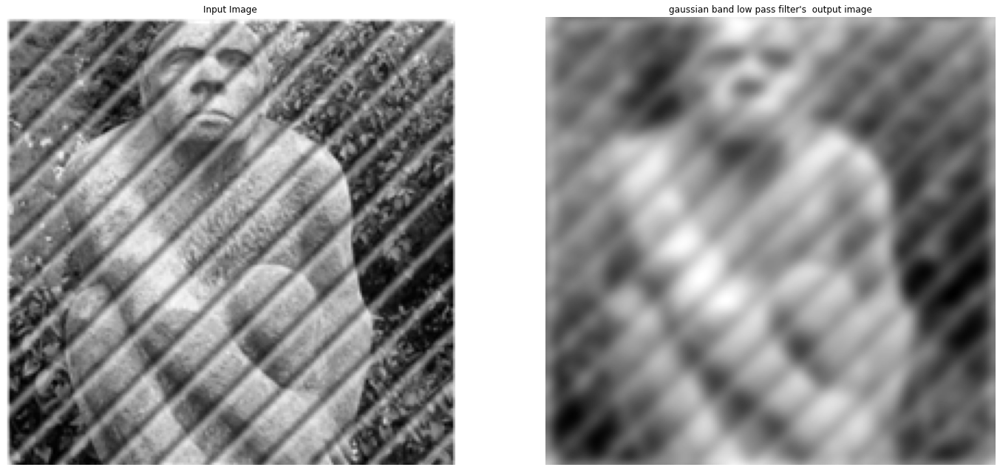

In [33]:
plot_2img(img2,img_GLPF,"gaussian band low pass filter")  